In [26]:
import os
import pandas as pd
import numpy as np
from pathlib import Path

import matplotlib.pyplot as plt

In [4]:
os.getcwd()

'/home/bkemmer/projects/custom_cnn/notebooks'

In [81]:
data_folder = Path('..', 'Data')
lfw2_path = Path(data_folder, 'lfw2')
train_path = Path(data_folder, 'pairsDevTrain.txt')
test_path = Path(data_folder, 'pairsDevTest.txt')

In [69]:
def getDF(path):
    with open(path) as f:
        file_list = f.readlines()
    n = int(file_list[0].strip())
    df_inicial = pd.read_csv(path, sep='\t', skiprows=1, nrows=n, names=['pair_name_1', 'pair_id_1', 'pair_id_2'])
    df_inicial['pair_name_2'] = None
    df_secondary = pd.read_csv(path, sep='\t', skiprows=n+1, names=['pair_name_1', 'pair_id_1', 'pair_name_2', 'pair_id_2'])
    df = pd.concat([df_inicial, df_secondary])
    print(df.shape)
    return df

In [103]:
def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [70]:
df_train = getDF(train_path)

(2200, 4)


In [71]:
df_test = getDF(test_path)

(1000, 4)


In [107]:
def processImages(df, show=False, limit=np.inf):
    i=0
    for row in df.iterrows():
        pair_name = row[1]['pair_name_1']
        file_id = row[1]['pair_id_1']
        file_id = str(file_id).zfill(4)
        fname1 = '_'.join([pair_name, file_id])
        fname1 = '.'.join([fname1, 'jpg'])
        path = Path(lfw2_path, pair_name, fname1)
        img1 = plt.imread(path)
            
        if row[1]['pair_name_2'] is not None:
            pair_name = row[1]['pair_name_2']
        file_id = row[1]['pair_id_2']
        file_id = str(file_id).zfill(4)
        fname2 = '_'.join([pair_name, file_id])
        fname2 = '.'.join([fname2, 'jpg'])
        path = Path(lfw2_path, pair_name, fname2)
        img2 = plt.imread(path)
        if show and i <= limit:
            i += 1
            show_image(img1, title=fname1)
            show_image(img2, title=fname2)

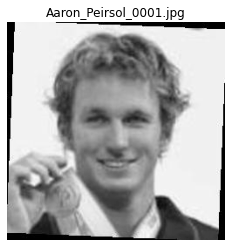

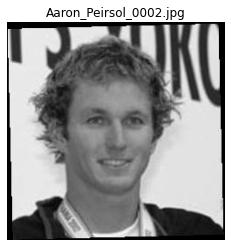

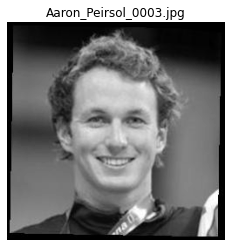

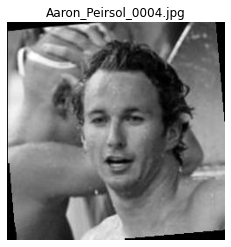

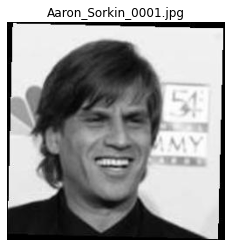

...

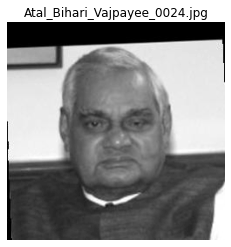

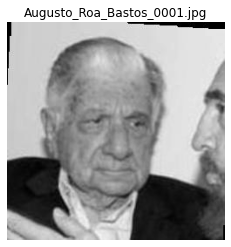

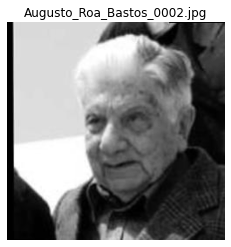

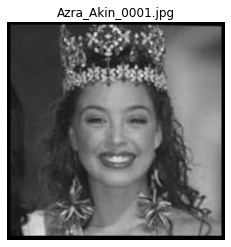

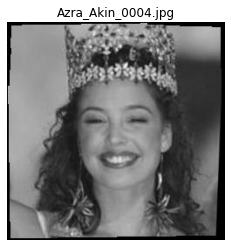

In [108]:
processImages(df_train, show=True, limit=100)

In [96]:
np.max(img)

255

In [95]:
img.shape

(250, 250)

In [94]:
type(img)

numpy.ndarray

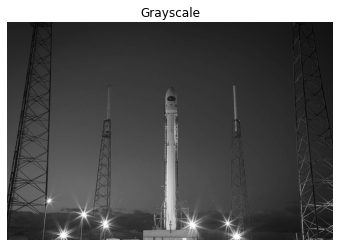

In [28]:


grayscale = color.rgb2gray(rocket_image)
show_image(grayscale, "Grayscale")